In [1]:
# Library for the notebook
import cv2
import numpy as np
import matplotlib.pyplot as plt

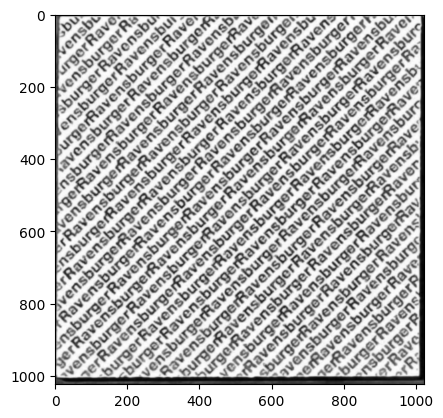

In [40]:
from supplied import extract_sift_features, match_descriptors

card_back = cv2.imread("jpg/IMG_2131.jpg",cv2.IMREAD_GRAYSCALE) # Load the card back image in grayscale
card_back = cv2.resize(card_back,(1024,1024)) # Resize the image to a fixed size for consistency and faster processing

clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8)) 
card_back = clahe.apply(card_back) # Apply CLAHE to enhance contrast 
card_back = cv2.GaussianBlur(card_back, (5, 5), 0) # Apply Gaussian blur to reduce noise

plt.imshow(cv2.cvtColor(card_back, cv2.COLOR_BGR2RGB)) # Display the card back image

keypoints_face_down, descriptors_face_down = extract_sift_features(card_back) # Extract SIFT features from the card back image


In [ ]:
def card_matches(image_path,test=False):
    win = None #flag for the match

    # -----------Image reading------------

    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Could not open or find the image at {image_path}")
        return None
    
    resize=1024

    img = cv2.resize(img,(resize,resize)) # resize the image to a fixed size for consistency and faster processing

    # -----------End of Image reading------------

    # -----------Image preprocessing------------

    kernel = np.ones((3,3), dtype=np.uint8) # create a kernel for dilated and eroded operations

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) # convert the image to grayscale
    blurred = cv2.GaussianBlur(gray, (5, 5), 0) # apply Gaussian blur to reduce noise and improve edge detection

    eroded1 = cv2.erode(blurred,kernel, iterations=3) # reduce noise and sharper edges
    dilated1 = cv2.dilate(eroded1, kernel, iterations=4) # improve the visibility of edges and close gaps

    canny = cv2.Canny(dilated1,40,255)
    dilated2 = cv2.dilate(canny, kernel, iterations=5) # close gaps
    eroded2 = cv2.erode(dilated2,kernel, iterations=5) # back to the original card size

    # -----------End of image preprocessing------------

    # -----------Contour detection and cropping------------

    contours, _ = cv2.findContours(eroded2.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE) # find contours in the image
    
    output_img = img.copy() 
    cropped_cards = [] 
    cropped_face_cards =[] 
    good_matches_count = [] 
    non_back_crop_descriptors = [] 
    non_back_crop_countour = [] 

    for c in contours:
        if cv2.contourArea(c) > img.shape[0]*10: # filter out small contours
            peri = cv2.arcLength(c, True) # calculate the perimeter of the contour
            approx = cv2.approxPolyDP(c, 0.04 * peri, True) # approximate the contour to a polygon

            if len(approx) >= 4: # if the approximated contour has more than four vertices I'm assuming it's a card
                x, y, w, h = cv2.boundingRect(approx) 

                mask = np.zeros(img.shape[:2], dtype=np.uint8) 
                cv2.drawContours(mask, [approx], -1, 255, cv2.FILLED) # draw the filled contour on the mask
                cropped_image = cv2.bitwise_and(img, img, mask=mask) # selecting only the contour in the original image to remove background

                cropped_card = cropped_image[max(0,y):min((img.shape[0]),y+h), max(0,x):min((img.shape[1]),x+w)] # cropped card with removed background
                cropped_cards.append(cropped_card)
    
    # ---------End of contour detection and cropping------------

    # ---------SIFT feature extraction and matching with card back------------

                cropped_card_gray = cv2.cvtColor(cropped_card, cv2.COLOR_BGR2GRAY)
                cropped_card_gray = clahe.apply(cropped_card_gray) # to improve contrast

                keypoints_target, descriptors_target = extract_sift_features(cropped_card_gray) # SIFT extraction from the cropped card
                good_matches, matches = match_descriptors(descriptors_face_down, descriptors_target,0.6) # match descriptors between the face down card and the cropped image
                good_matches_count.append(len(good_matches))
            
                if (len(good_matches) >=20): # if it's a face down card
                    cv2.rectangle(output_img, (x, y), (x + w, y + h), (217, 68, 36), 5) # draw a blue bounding box
                else:
                    non_back_crop_descriptors.append(descriptors_target)
                    non_back_crop_countour.append(approx)
                    cropped_face_cards.append(cropped_card)

    # ---------End of SIFT feature extraction and matching with card back------------

    # ---------Matching non-back cropped cards and drawing bounding boxes------------

    if len(non_back_crop_countour) == 2: # if there are two face up cards
        good_matches, matches = match_descriptors(non_back_crop_descriptors[0],non_back_crop_descriptors[1],0.6) # match descriptors between the two face up cards
        face_card_matches = len(good_matches)
        if len(good_matches)>=20: # if it's a match
            for i in range(2):
                x, y, w, h = cv2.boundingRect(non_back_crop_countour[i])
                cv2.rectangle(output_img, (x, y), (x + w, y + h), (0, 255, 0), 5) # draw a green bounding box
                win = True # flag for the match
        else:            
            win = False
            for i in range(2):
                x, y, w, h = cv2.boundingRect(non_back_crop_countour[i])
                cv2.rectangle(output_img, (x, y), (x + w, y + h), (0, 0, 255), 5) # draw a red bounding box
    elif len(non_back_crop_countour)>0: # if there are one or more than two face up cards
        for i in range(len(non_back_crop_countour)):
            x, y, w, h = cv2.boundingRect(non_back_crop_countour[i])
            cv2.rectangle(output_img, (x, y), (x + w, y + h), (0, 0, 255), 5) # draw a red bounding box

    # ---------End of matching non-back cropped cards and drawing bounding boxes------------
         
    # ---------Display debugging images------------

    if test: 
        print("Preprocess of the original image")
        # f,ax = plt.subplots(1, 7, figsize=(20, 10))
        # ax[0].imshow(gray, cmap='gray')
        # ax[0].set_title('Gray Image')
        # ax[1].imshow(blurred, cmap='gray')
        # ax[1].set_title('Blurred Image')
        # ax[2].imshow(eroded1, cmap='gray')
        # ax[2].set_title('Eroded1 Image')
        # ax[3].imshow(dilated1, cmap='gray')
        # ax[3].set_title('Dilated1 Image')
        # ax[4].imshow(canny, cmap='gray')
        # ax[4].set_title('Canny image')
        # ax[5].imshow(dilated2, cmap='gray')
        # ax[5].set_title('Dilated2 Image')
        # ax[6].imshow(eroded2, cmap='gray')
        # ax[6].set_title('Eroded2 Image')
        # for i in range(7):
        #     ax[i].axis('off')
        # plt.show()

        f,ax = plt.subplots(1,1)
        ax.imshow(eroded2,cmap="gray")
        ax.axis("off")
        ax.set_title("Eroded2 Image")
        plt.show()

        if len(cropped_cards)>0:
            print("cropped cards (GM = good matches between a face down card and the cropped card)")
            f,ax = plt.subplots(1, len(cropped_cards), figsize=(len(cropped_cards), 1))
            for  i, card in enumerate(cropped_cards):
                if card is not None and not card.size == 0:  # Check if card is valid
                    if len(cropped_cards) == 1:
                        ax.imshow(cv2.cvtColor(card, cv2.COLOR_BGR2RGB))
                        ax.set_title(f"{good_matches_count[i]}")
                        ax.axis('off')
                    else:
                        ax[i].set_title(f'GM={good_matches_count[i]}')
                        ax[i].imshow(cv2.cvtColor(card, cv2.COLOR_BGR2RGB))
                        ax[i].axis('off')
            plt.show()

        if len(cropped_face_cards)>0:
            print("cropped face cards (GM = good matches between the two face up cards)")
            f,ax = plt.subplots(1, len(cropped_face_cards), figsize=(len(cropped_face_cards), 1))
            for  i, card in enumerate(cropped_face_cards):
                if card is not None and not card.size == 0:  # Check if card is valid
                    if len(cropped_face_cards) == 1:
                        ax.imshow(cv2.cvtColor(card, cv2.COLOR_BGR2RGB))
                        ax.axis('off')
                    else:
                        if len(cropped_face_cards)==2:
                            ax[i].set_title(f"GM={face_card_matches}")
                            ax[i].imshow(cv2.cvtColor(card, cv2.COLOR_BGR2RGB))
                            ax[i].axis('off')
                        else:
                            ax[i].imshow(cv2.cvtColor(card, cv2.COLOR_BGR2RGB))
                            ax[i].axis('off')
        plt.show()

    # ---------End of display debugging images------------

    return output_img, win

Preprocess of the original image


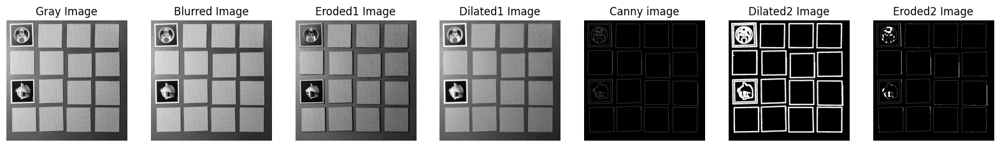

cropped cards (GM = good matches between a face down card and the cropped card)


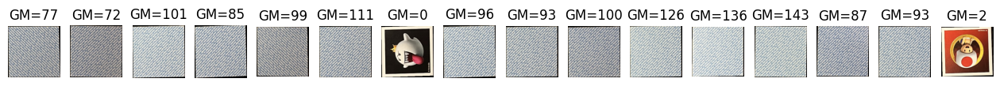

cropped face cards (GM = good matches between the two face up cards)


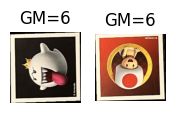

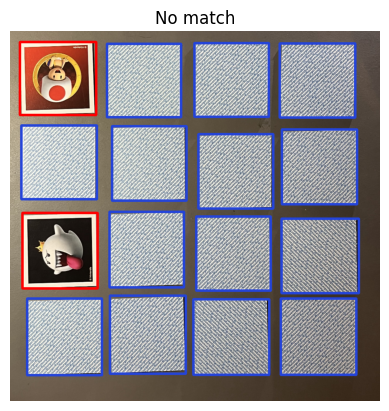

Preprocess of the original image


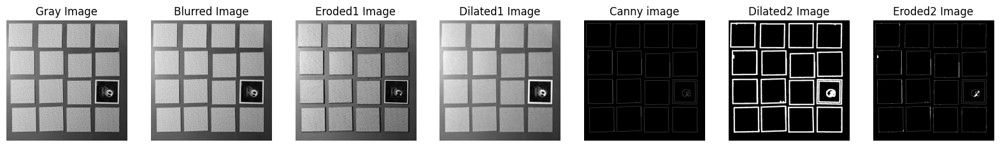

cropped cards (GM = good matches between a face down card and the cropped card)


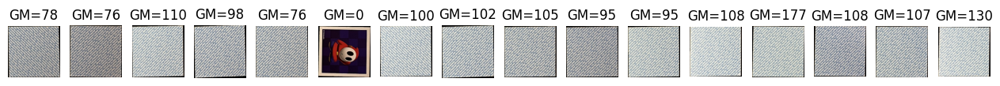

cropped face cards (GM = good matches between the two face up cards)


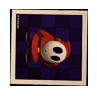

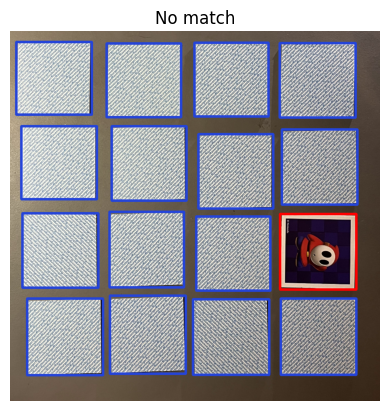

Preprocess of the original image


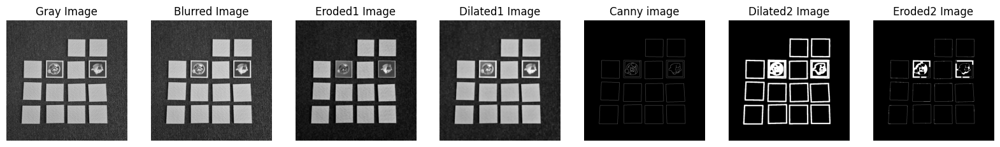

cropped cards (GM = good matches between a face down card and the cropped card)


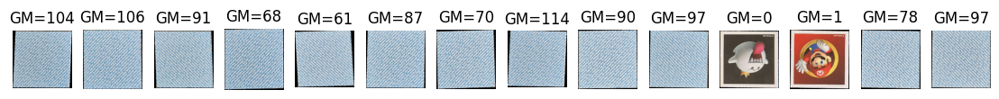

cropped face cards (GM = good matches between the two face up cards)


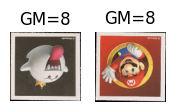

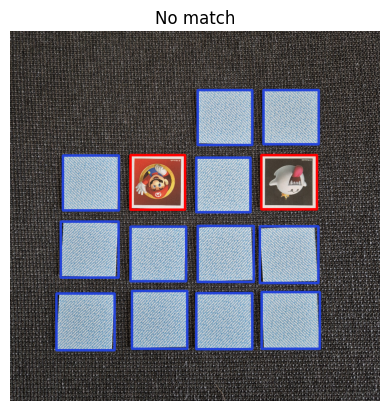

Preprocess of the original image


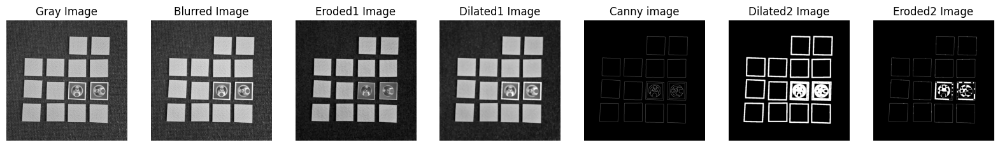

cropped cards (GM = good matches between a face down card and the cropped card)


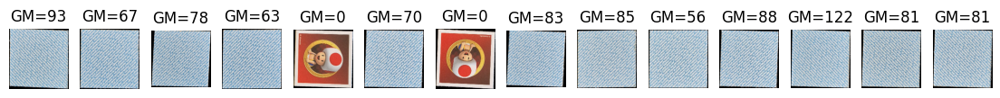

cropped face cards (GM = good matches between the two face up cards)


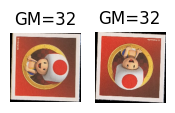

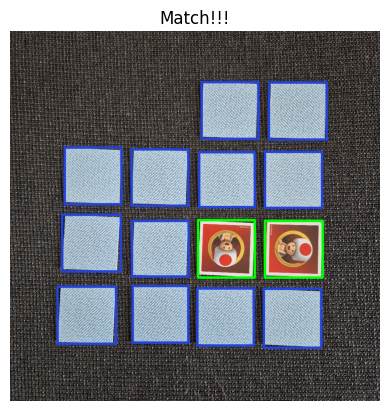

In [48]:
image_paths = []
for i in range(2091, 2092 + 1): # maximum range 2089,2106
    file_name = f"jpg/IMG_{i}.jpg"
    image_paths.append(file_name)

for i in range(6, 7 + 1): # maximum range 0,13
    file_name = f"jpg/round1_{i}.jpg"
    image_paths.append(file_name)

for image_file in image_paths:
    processed_image, win = card_matches(image_file, test=True)

    if processed_image is not None:
        plt.imshow(cv2.cvtColor(processed_image, cv2.COLOR_BGR2RGB))
        if(win):
            plt.title('Match!!!')
        else:
            plt.title('No match')
        plt.axis('off')
        plt.show()


In [86]:
def memory_match(image_paths, first_turn):
    player1 = 0
    player2 = 0
    turn = first_turn # true player 1, false player 2
    if turn:
        print("First turn, Player 1 to choose")
    else:
        print("First turn, Player 2 to choose")
    for i,image_file in enumerate(image_paths):
        processed_image, win = card_matches(image_file, test=False)

        if i!=0:
            if  turn:
                print("Player 1 is picking")
                if win:
                    print("Congratulations! A matching pair. Please pick up your matching card pair and then you may continue")
                    player1 +=1
                elif win == False:
                    print("No match! Turn back the two cards face down again. Player 2 may then continue")
                    turn = False
            else:
                print("Player 2 is picking")
                if win:
                    print("Congratulations! A matching pair. Please pick up your matching card pair and then you may continue")
                    player2 +=1
                elif win == False:
                    print("No match! Turn back the two cards face down again. Player 1 may then continue")
                    turn = True

            if win == None:
                print("Turn not valid. Please pick again")
        
            print(f"Player 1 = {player1}, Player 2 = {player2}")
            
        if processed_image is not None:
            f,ax = plt.subplots(1,1)
            plt.imshow(cv2.cvtColor(processed_image, cv2.COLOR_BGR2RGB))
            if win:
                plt.title('Match!!!')
            else:
                plt.title('No match')
            plt.axis('off')
            plt.show()

    if player1 > player2:
        print("Player 1 wins")
    elif player2 > player1:
        print("Player 2 wins")
    elif player1 == player2:
        print("The game is a tie")


First turn, Player 1 to choose


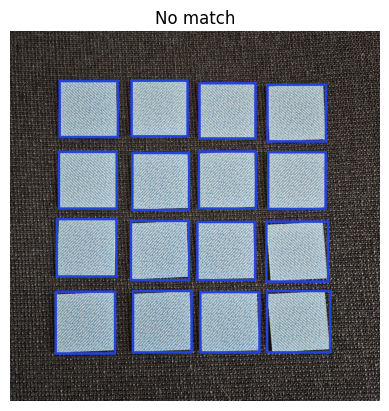

Player 1 is picking
No match! Turn back the two cards face down again. Player 2 may then continue
Player 1 = 0, Player 2 = 0


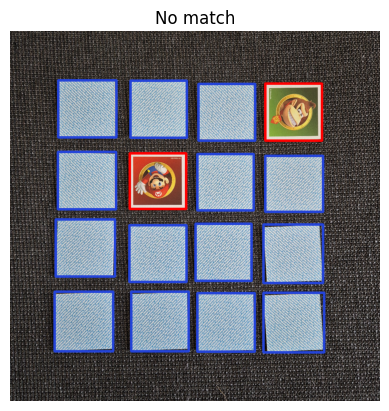

Player 2 is picking
Turn not valid. Please pick again
Player 1 = 0, Player 2 = 0


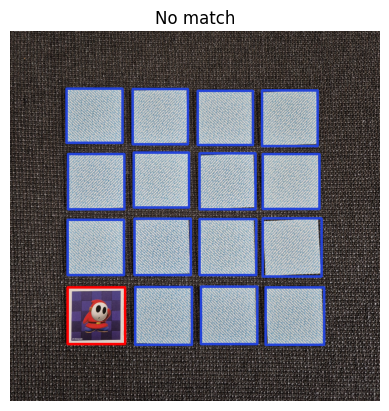

Player 2 is picking
Congratulations! A matching pair. Please pick up your matching card pair and then you may continue
Player 1 = 0, Player 2 = 1


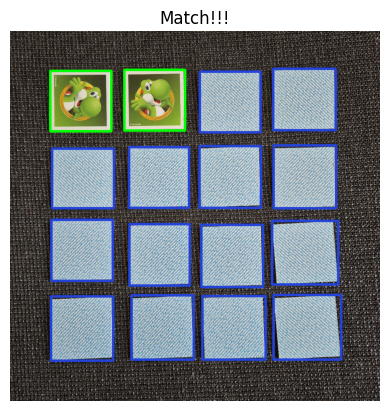

Player 2 is picking
No match! Turn back the two cards face down again. Player 1 may then continue
Player 1 = 0, Player 2 = 1


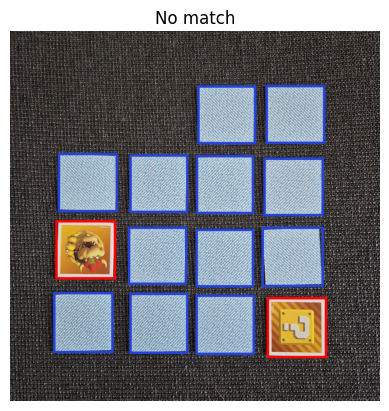

Player 1 is picking
No match! Turn back the two cards face down again. Player 2 may then continue
Player 1 = 0, Player 2 = 1


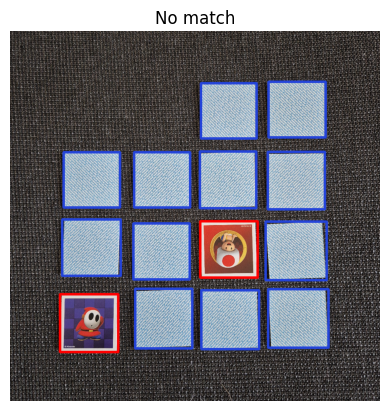

Player 2 is picking
No match! Turn back the two cards face down again. Player 1 may then continue
Player 1 = 0, Player 2 = 1


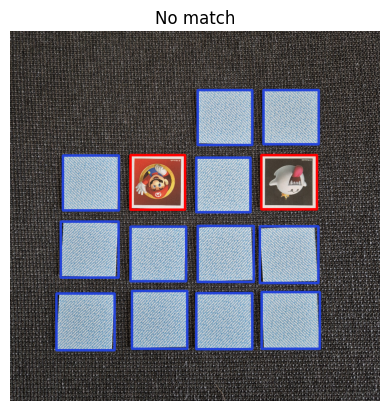

Player 1 is picking
Congratulations! A matching pair. Please pick up your matching card pair and then you may continue
Player 1 = 1, Player 2 = 1


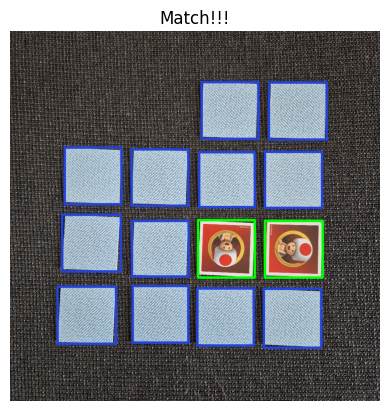

Player 1 is picking
Congratulations! A matching pair. Please pick up your matching card pair and then you may continue
Player 1 = 2, Player 2 = 1


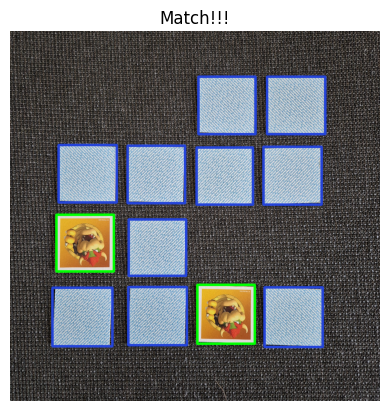

Player 1 is picking
Congratulations! A matching pair. Please pick up your matching card pair and then you may continue
Player 1 = 3, Player 2 = 1


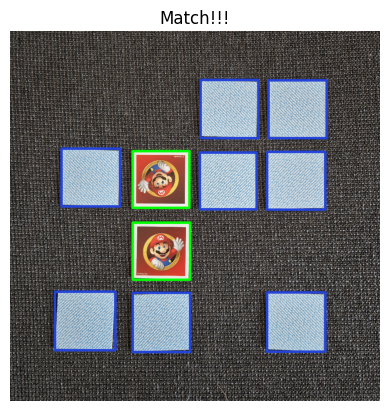

Player 1 is picking
Congratulations! A matching pair. Please pick up your matching card pair and then you may continue
Player 1 = 4, Player 2 = 1


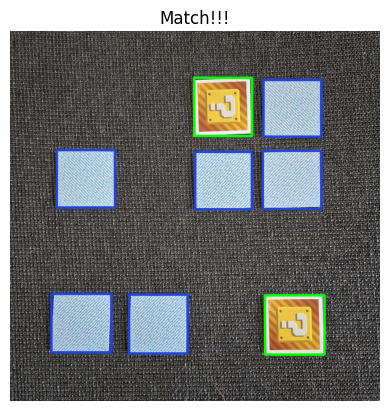

Player 1 is picking
Congratulations! A matching pair. Please pick up your matching card pair and then you may continue
Player 1 = 5, Player 2 = 1


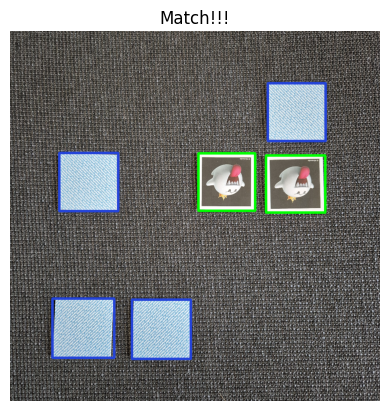

Player 1 is picking
Congratulations! A matching pair. Please pick up your matching card pair and then you may continue
Player 1 = 6, Player 2 = 1


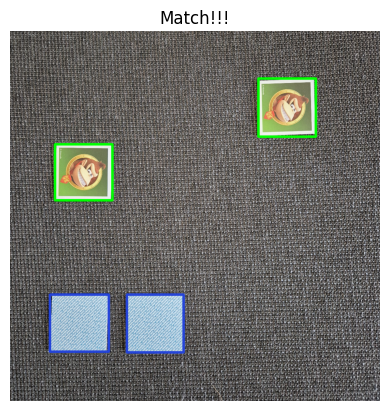

Player 1 is picking
Congratulations! A matching pair. Please pick up your matching card pair and then you may continue
Player 1 = 7, Player 2 = 1


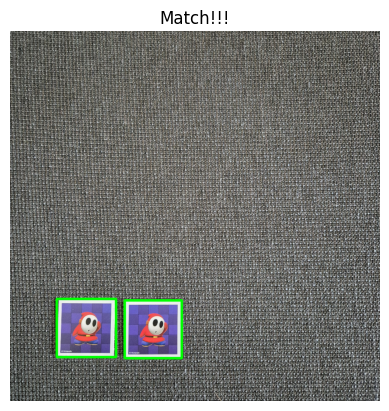

Player 1 wins


In [87]:
image_paths = []

for i in range(0, 13 + 1): # maximum range 0,13
    file_name = f"jpg/round1_{i}.jpg"
    image_paths.append(file_name)

memory_match(image_paths, first_turn=True)

In [ ]:
image_paths = []
for i in range(2089, 2106 + 1): # maximum range 2089,2106
    file_name = f"jpg/IMG_{i}.jpg"
    image_paths.append(file_name)

for i in range(0, 13 + 1): # maximum range 0,13
    file_name = f"jpg/round1_{i}.jpg"
    image_paths.append(file_name)

for image_file in image_paths:
    processed_image, win = card_matches(image_file, test=False)

    if processed_image is not None:
        plt.imshow(cv2.cvtColor(processed_image, cv2.COLOR_BGR2RGB))
        if(win):
            plt.title('Match!!!')
        else:
            plt.title('No match')
        plt.axis('off')
        plt.show()

Preprocess of the original image


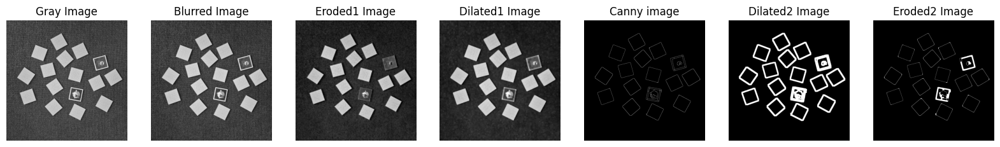

cropped cards (GM = good matches between a face down card and the cropped card)


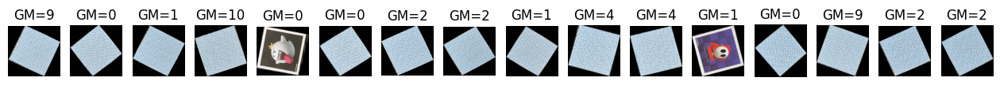

cropped face cards (GM = good matches between the two face up cards)


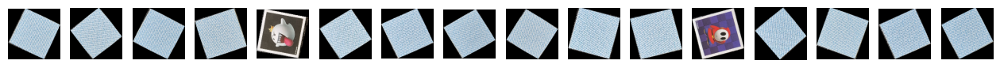

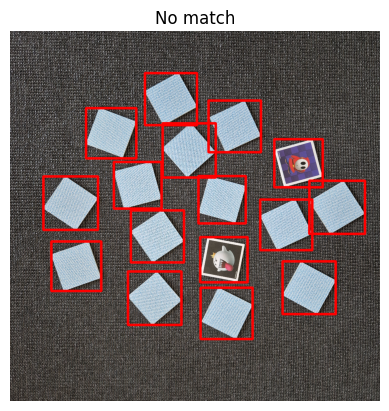

Preprocess of the original image


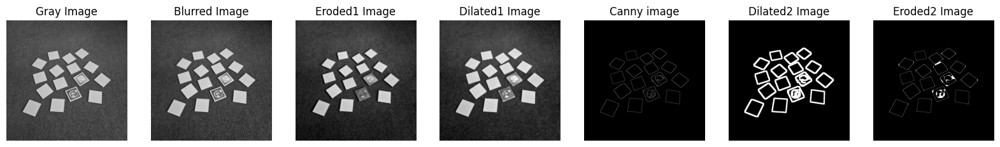

cropped cards (GM = good matches between a face down card and the cropped card)


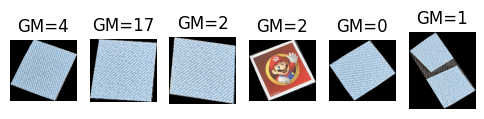

cropped face cards (GM = good matches between the two face up cards)


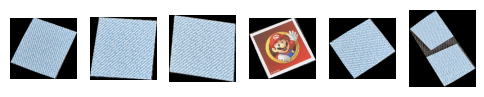

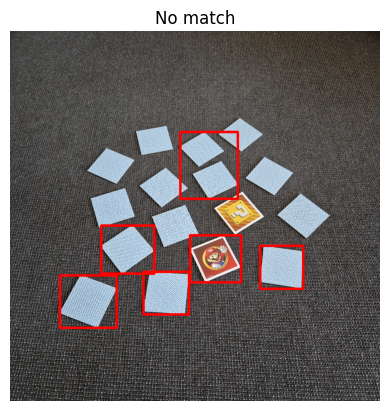

Preprocess of the original image


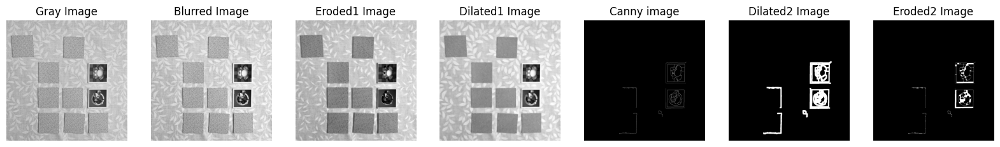

cropped cards (GM = good matches between a face down card and the cropped card)


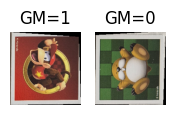

cropped face cards (GM = good matches between the two face up cards)


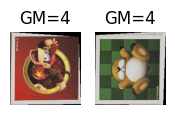

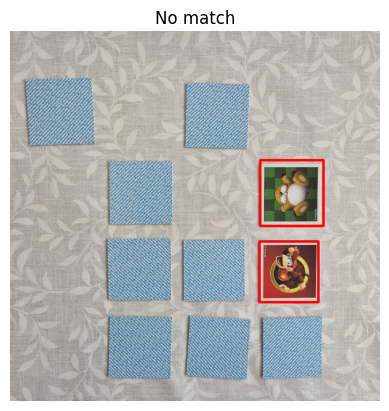

In [91]:
image_paths = []

for i in range(1, 3 + 1): # maximum range 0,13
    file_name = f"jpg/test{i}.jpg"
    image_paths.append(file_name)

for image_file in image_paths:
    processed_image, win = card_matches(image_file, test=True)

    if processed_image is not None:
        plt.imshow(cv2.cvtColor(processed_image, cv2.COLOR_BGR2RGB))
        if(win):
            plt.title('Match!!!')
        else:
            plt.title('No match')
        plt.axis('off')
        plt.show()